In [ ]:
import os
job_cancel_str="scancel " + os.environ['SLURM_JOBID']
os.system(job_cancel_str)

# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys, os

sys.path.append(os.path.abspath('..'))

In [3]:
from hit_finding.constants import *
from hit_finding.metrics import *

In [4]:
from learning_tabular.constants import CHANNELS, FAMILIES, LABEL_FIELD
from learning_tabular.preprocessing import load_plate_csv, list_columns

In [5]:
# from os import chdir, scandir, makedirs
import matplotlib.pyplot as plt
# from matplotlib.gridspec import GridSpec
import seaborn as sns


from tqdm.notebook import tqdm
from glob import glob

import os

# from itertools import cycle
# from multiprocessing import Pool, cpu_count

import pandas as pd
import numpy as np
import json

In [6]:
cols = json.load(open('/storage/users/g-and-n/plates/columns.txt', 'r'))
chans = [c for c in cols.keys() if c not in ['GENERAL', 'MIXED']]
chans

del cols['GENERAL']
del cols['MIXED']

cols['ALL'] = sum(cols.values(), [])

# Calculate SS-MAS

In [46]:
map_files = f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/pure/err/*.csv'
raw_files = f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/pure/raw/*.csv'
raw1to1_files = f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/pure/raw1to1/*.csv'

In [47]:
map_df = pd.concat([pd.read_csv(pth, index_col=[0,1,2,3]) for pth in glob(map_files)])
raw_df = pd.concat([pd.read_csv(pth, index_col=[0,1,2,3]) for pth in glob(raw_files)])
raw1to1_df = pd.concat([pd.read_csv(pth, index_col=[0,1,2,3]) for pth in glob(raw1to1_files)])

In [48]:
map_df.shape, raw_df.shape, raw1to1_df.shape

((146599, 414), (153370, 596), (146599, 414))

In [49]:
raw_df = raw_df.loc[map_df.index, map_df.columns]

In [50]:
map_df.shape, raw_df.shape, raw1to1_df.shape

((146599, 414), (146599, 414), (146599, 414))

In [51]:
map_df = map_df.query('Metadata_ASSAY_WELL_ROLE == "treated"').droplevel(1)
raw_df = raw_df.query('Metadata_ASSAY_WELL_ROLE == "treated"').droplevel(1)
raw1to1_df = raw1to1_df.query('Metadata_ASSAY_WELL_ROLE == "treated"').droplevel(1)

In [52]:
def generate_scores(cpdf, abs_zscore=True):
    res = {}
    rep_cnt, fet_cnt = cpdf.shape

    corr = cpdf.astype('float64').T.corr(method='pearson').values
    if len(corr) == 1:
        med_corr = 1
    else:
        med_corr = np.median(list(corr[np.triu_indices(len(corr), k = 1)]))
        
    res['Med_Corr'] = med_corr
    
    cpdf_norm = cpdf * np.sqrt(rep_cnt)
    
    if abs_zscore:
        cpdf_norm = abs(cpdf_norm.T)

    for t in range(2, 21):
        gtr_t_cnt = (cpdf_norm >= t).sum().sum()
        ss_norm = gtr_t_cnt / rep_cnt
        mas = np.sqrt((max(med_corr, 0) * ss_norm) / fet_cnt)
        res[f'SS_{t}'] = ss_norm
        res[f'MAS_{t}'] = mas
    
    return pd.Series(res)

In [116]:
map_res.shape, raw_res.shape, raw1to1_res.shape

((30438, 4), (30438, 4), (30438, 4))

In [154]:
map_res = {chan: map_df[c].groupby('Metadata_broad_sample').apply(generate_scores).add_prefix(f'{chan}_') for chan, c in cols.items()}
pd.concat([rep_cnt, *map_res.values()], axis=1).to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/map.csv')

/home/naorko/.conda/envs/tf-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/naorko/.conda/envs/tf-env/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
raw_res = {chan: raw_df[c].groupby('Metadata_broad_sample').apply(generate_scores).add_prefix(f'{chan}_') for chan, c in cols.items()}
pd.concat([rep_cnt, *raw_res.values()], axis=1).to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw.csv')

In [ ]:
raw1to1_res = {chan: raw1to1_df[c].groupby('Metadata_broad_sample').apply(generate_scores).add_prefix(f'{chan}_') for chan, c in cols.items()}
pd.concat([rep_cnt, *raw1to1_res.values()], axis=1).to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw1to1.csv')

### No Absulote

In [ ]:
map_res = {chan: map_df[c].groupby('Metadata_broad_sample').apply(generate_scores, abs_zscore=False).add_prefix(f'{chan}_') for chan, c in cols.items()}
pd.concat([rep_cnt, *map_res.values()], axis=1).to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/map_no-abs.csv')

In [ ]:
raw_res = {chan: raw_df[c].groupby('Metadata_broad_sample').apply(generate_scores, abs_zscore=False).add_prefix(f'{chan}_') for chan, c in cols.items()}
pd.concat([rep_cnt, *raw_res.values()], axis=1).to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw_no-abs.csv')

In [ ]:
raw1to1_res = {chan: raw1to1_df[c].groupby('Metadata_broad_sample').apply(generate_scores, abs_zscore=False).add_prefix(f'{chan}_') for chan, c in cols.items()}
pd.concat([rep_cnt, *raw1to1_res.values()], axis=1).to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw1to1_no-abs.csv')

In [7]:
map_res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/map_no-abs.csv', index_col=[0])
raw_res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw.csv', index_col=[0])
raw1to1_res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw1to1_no-abs.csv', index_col=[0])

## Merge Result

In [ ]:
map_res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/map.csv', index_col=[0])
raw_res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw.csv', index_col=[0])
raw1to1_res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/raw1to1.csv', index_col=[0])

In [ ]:
map_res.shape, raw_res.shape, raw1to1_res.shape

((30438, 235), (30438, 235), (30438, 235))

In [8]:
res = map_res.join(raw_res.iloc[:,1:], how='inner', lsuffix='_map', rsuffix='_raw')
res.shape

(30438, 469)

In [9]:
res = res.join(raw1to1_res.add_suffix('_raw1to1').iloc[:,1:], how='inner')
res.shape

(30438, 703)

In [10]:
res.to_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/all_no-abs.csv')

# Load Results

In [7]:
res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/all.csv', index_col=[0])

In [ ]:
res = pd.read_csv(f'/storage/users/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/all_no-abs.csv', index_col=[0])

In [ ]:
res

# Plot Results

In [ ]:
ts = [2, 6, 10, 14]

In [ ]:
# https://stackoverflow.com/questions/22104256/does-matplotlib-have-a-function-for-drawing-diagonal-lines-in-axis-coordinates
def add_identity(axes, *line_args, **line_kwargs):
    identity, = axes.plot([], [], *line_args, **line_kwargs)
    def callback(axes):
        low_x, high_x = axes.get_xlim()
        low_y, high_y = axes.get_ylim()
        low = max(low_x, low_y)
        high = min(high_x, high_y)
        identity.set_data([low, high], [low, high])
    callback(axes)
    axes.callbacks.connect('xlim_changed', callback)
    axes.callbacks.connect('ylim_changed', callback)
    return axes

## SS - map vs. raw

In [ ]:
nrow = 2
ncol = 3
d={'xlabel':"Signature Strength raw", 'ylabel':"Signature Strength map"}
colms = cols.keys()

for t in ts:

    fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    fig.suptitle(f'Z-score > {t}', fontsize = 24, y = 0.95)


    for i, col in enumerate(colms):
        ax[i//ncol,i%ncol].set_title(f'{col}')
        _ = sns.scatterplot(data=res, x=f'{col}_SS_{t}_raw', y=f'{col}_SS_{t}_map', hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])

    for i in range(nrow*ncol):
    #     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
    #     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
    #     ax[i//ncol,i%ncol].set(xlim=(0, lim), ylim=(0, lim))
    #     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
        add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


        ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                         bottom=True, top=False, left=True, right=False)
        ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
        ax[i//ncol,i%ncol].yaxis.label.set_size(12)
        ax[i//ncol,i%ncol].xaxis.label.set_size(12)
        ax[i//ncol,i%ncol].title.set_size(14)

    # ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

    # _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

#     _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png', format='png')

In [16]:
from PIL import Image
import glob

imgs = [f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png' for t in range(2,21)]
# Create the frames
frames = []
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
 
# Save into a GIF file that loops forever
frames[0].save(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

## SS - map vs. raw1to1

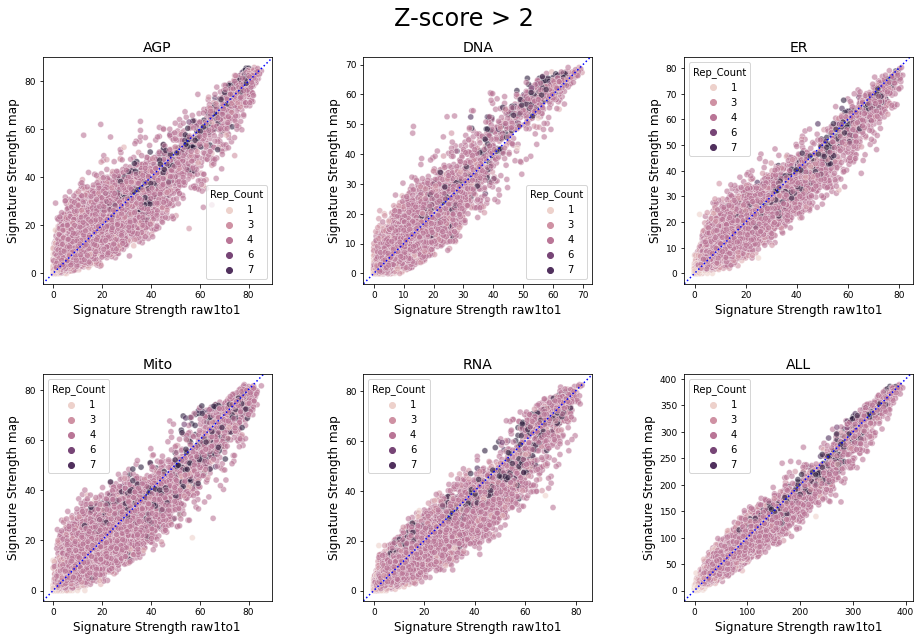

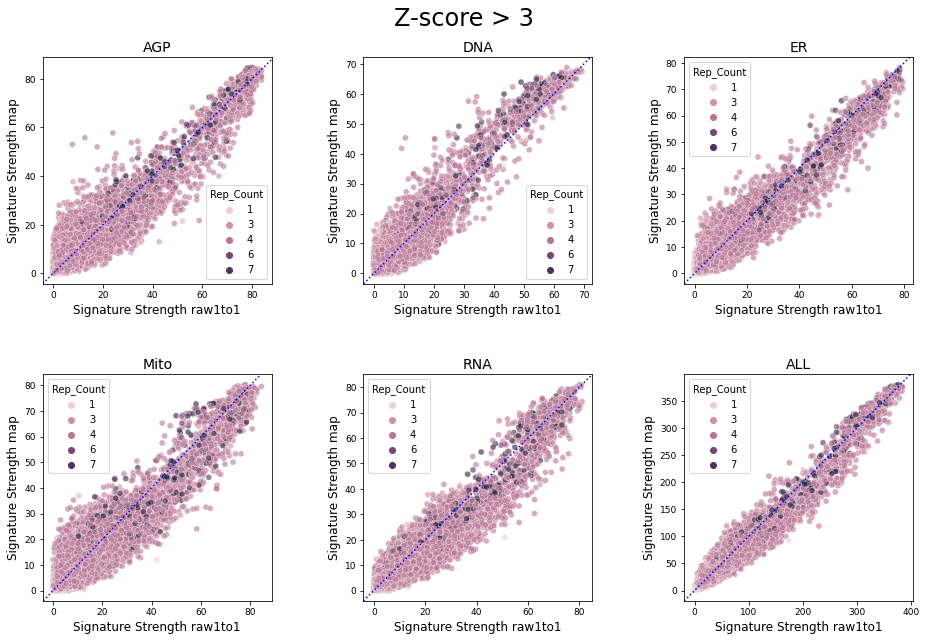

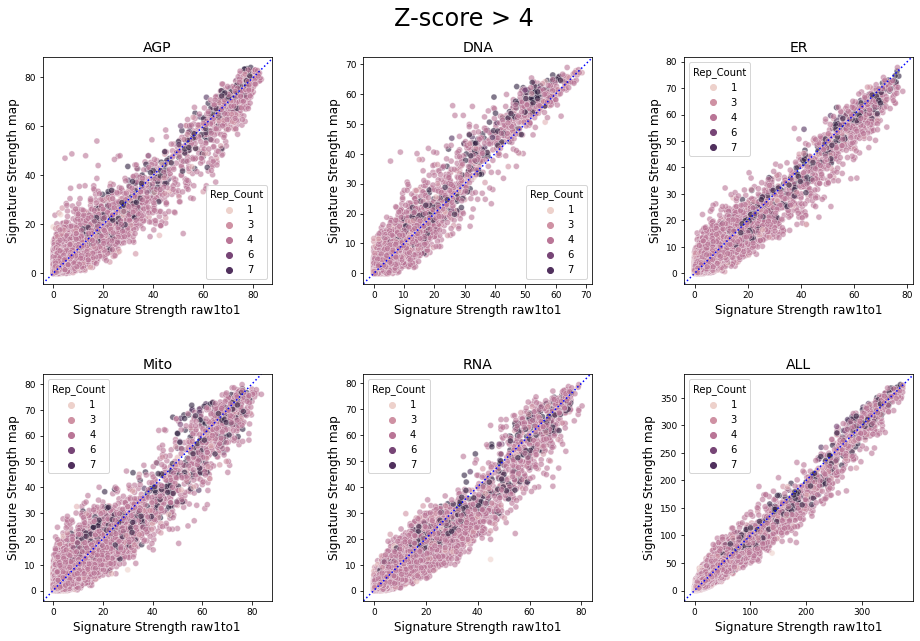

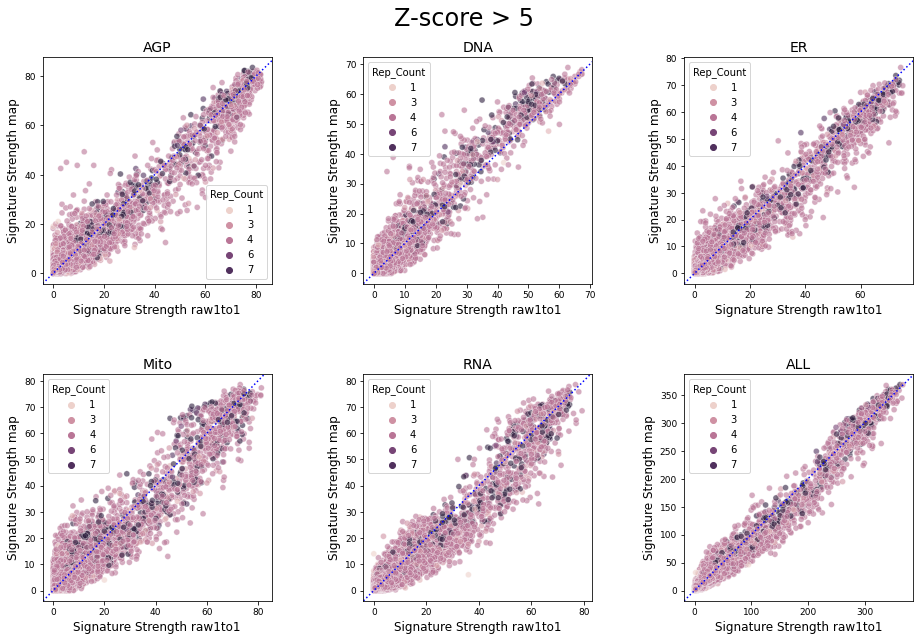

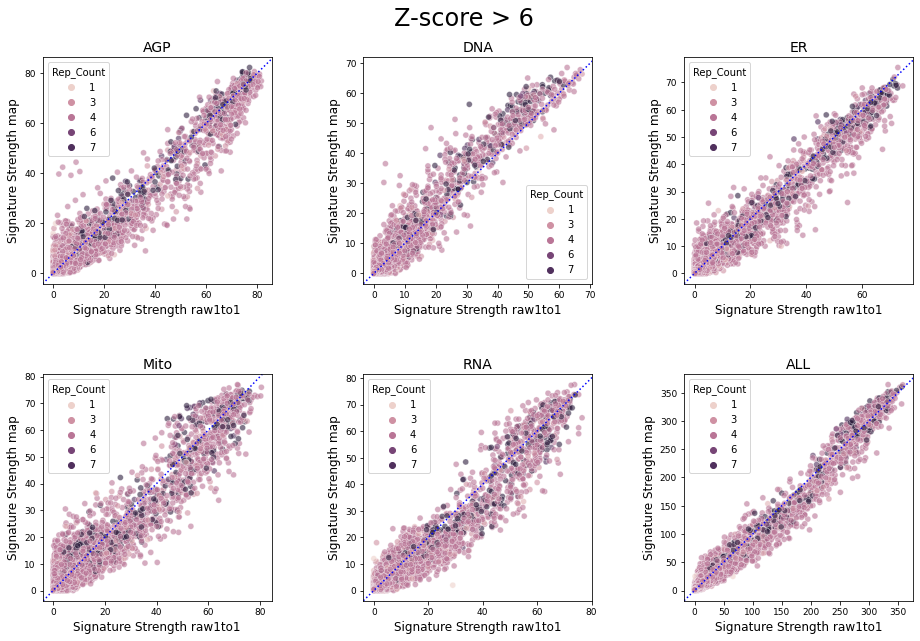

...

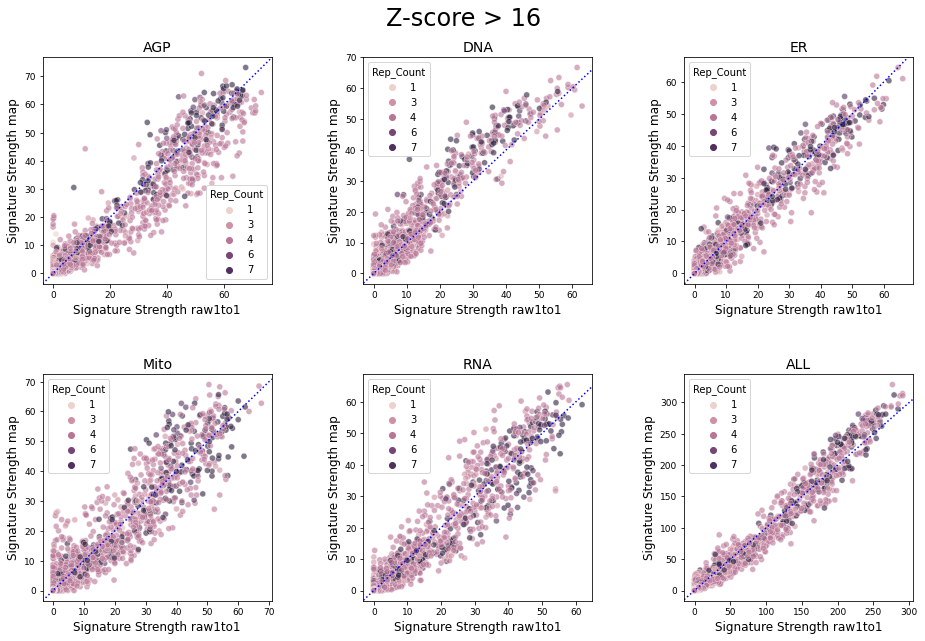

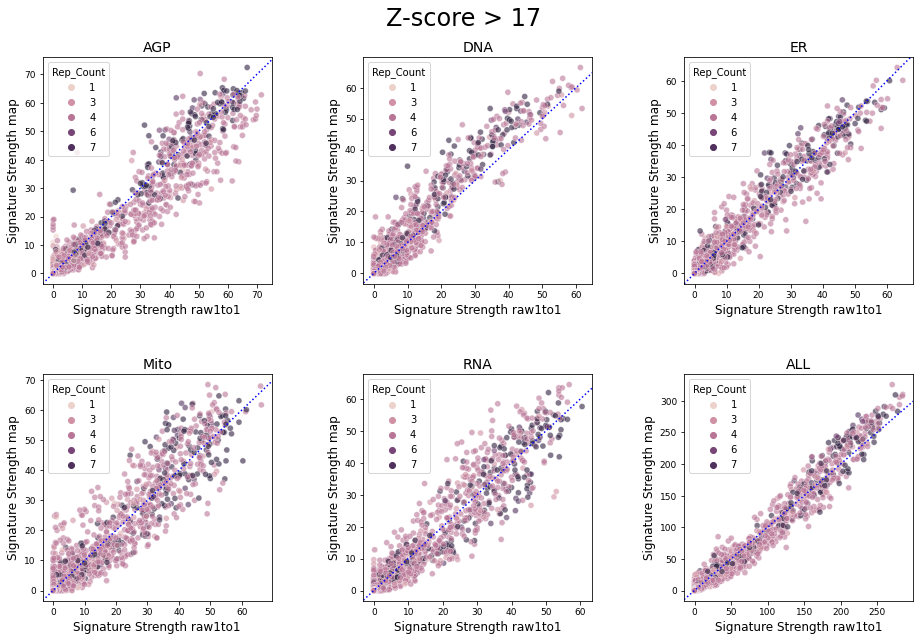

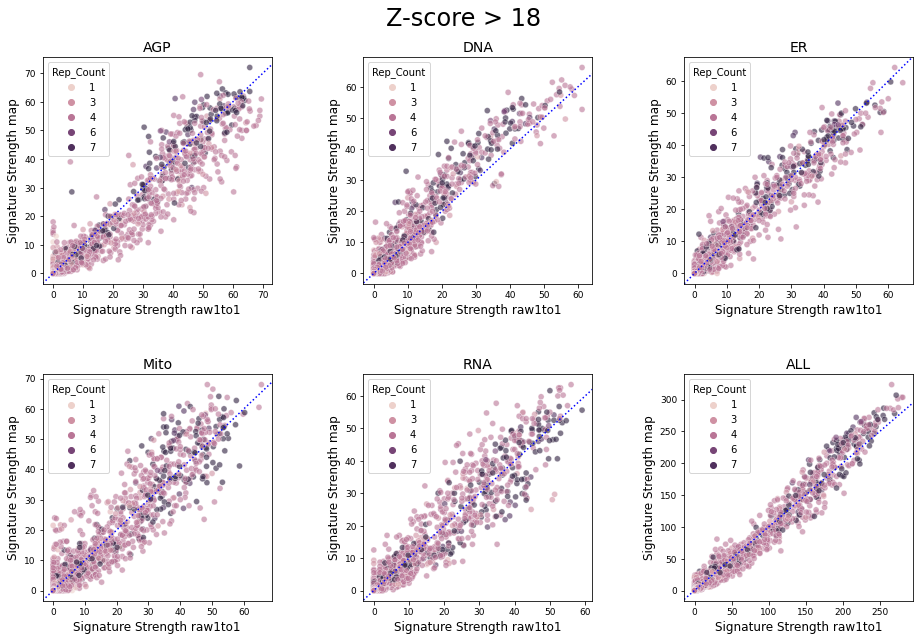

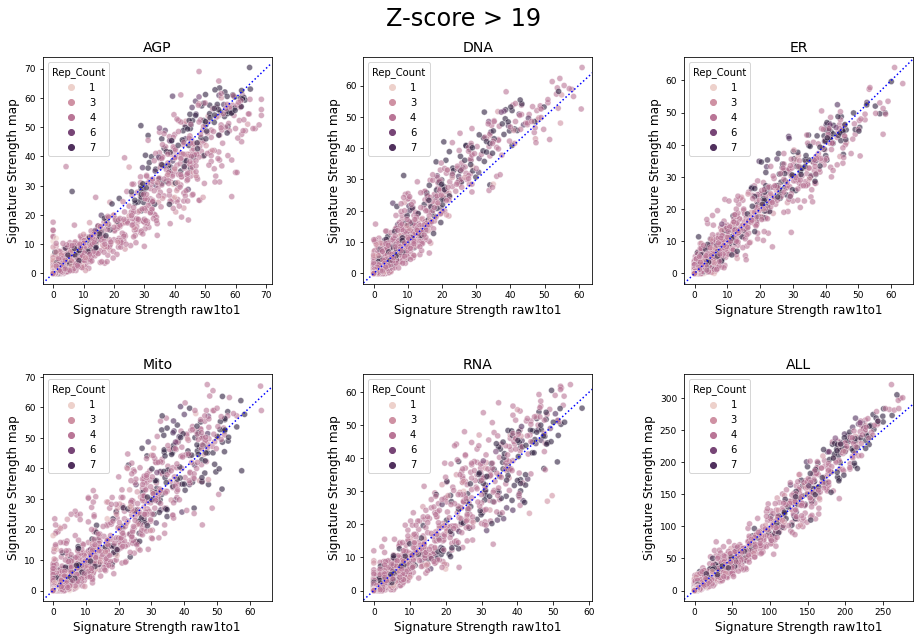

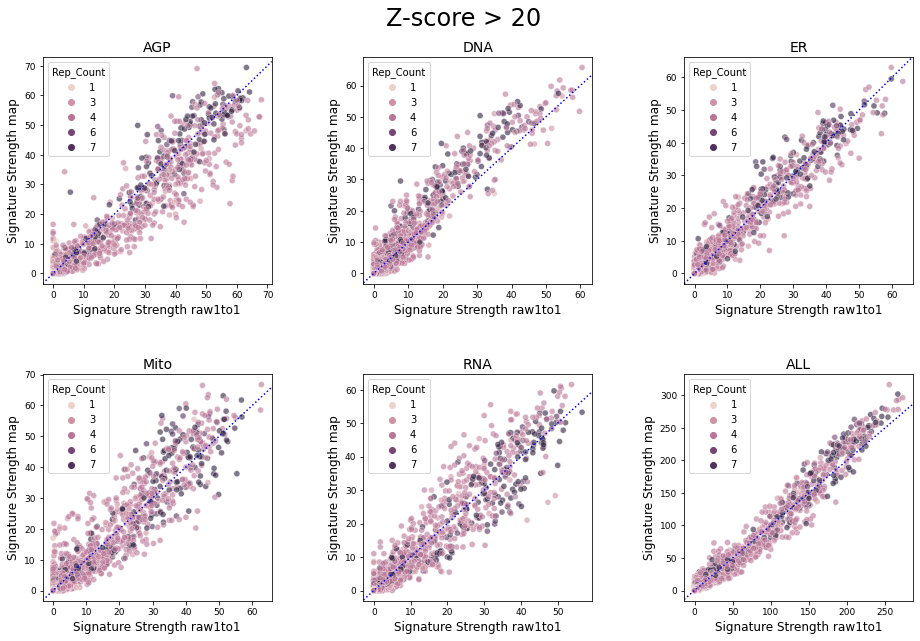

In [17]:
nrow = 2
ncol = 3
d={'xlabel':"Signature Strength raw1to1", 'ylabel':"Signature Strength map"}
colms = cols.keys()

for t in range(2, 21):

    fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    fig.suptitle(f'Z-score > {t}', fontsize = 24, y = 0.95)


    for i, col in enumerate(colms):
        ax[i//ncol,i%ncol].set_title(f'{col}')
        _ = sns.scatterplot(data=res, x=f'{col}_SS_{t}_raw1to1', y=f'{col}_SS_{t}_map', hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])

    for i in range(nrow*ncol):
    #     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
    #     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
    #     ax[i//ncol,i%ncol].set(xlim=(0, lim), ylim=(0, lim))
    #     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
        add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


        ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                         bottom=True, top=False, left=True, right=False)
        ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
        ax[i//ncol,i%ncol].yaxis.label.set_size(12)
        ax[i//ncol,i%ncol].xaxis.label.set_size(12)
        ax[i//ncol,i%ncol].title.set_size(14)

    # ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

    # _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

    _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw1to1-map-no-abs-{t}.png', format='png')

In [18]:
from PIL import Image
import glob

imgs = [f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw1to1-map-no-abs-{t}.png' for t in range(2,21)]
# Create the frames
frames = []
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
 
# Save into a GIF file that loops forever
frames[0].save(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw1to1-map-no-abs.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

## MAS - map vs. raw

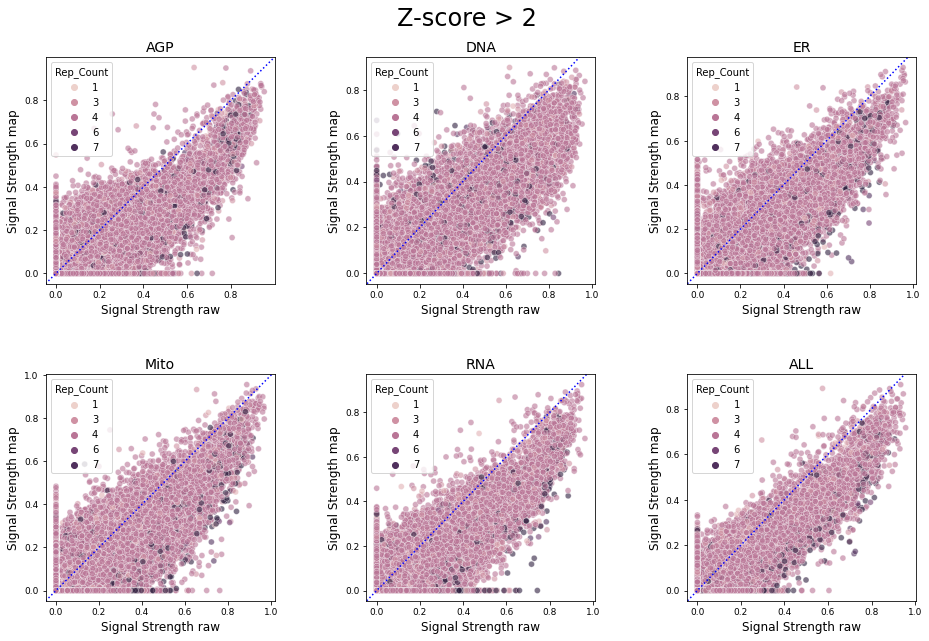

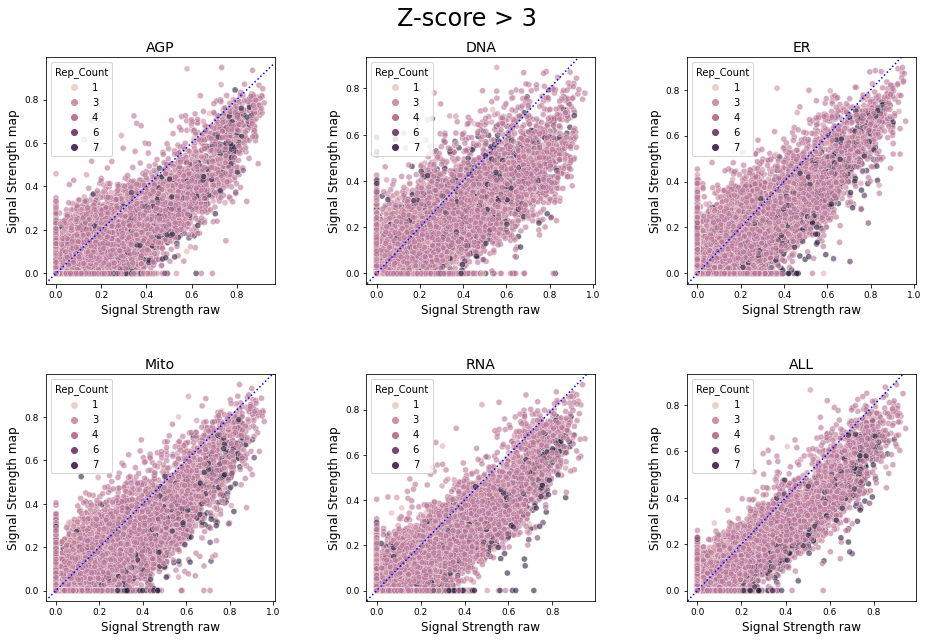

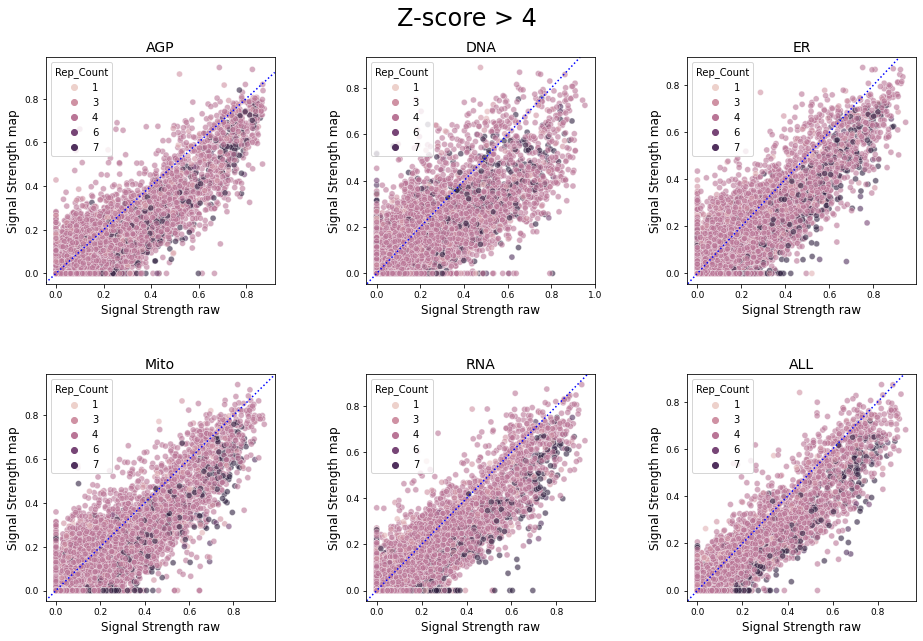

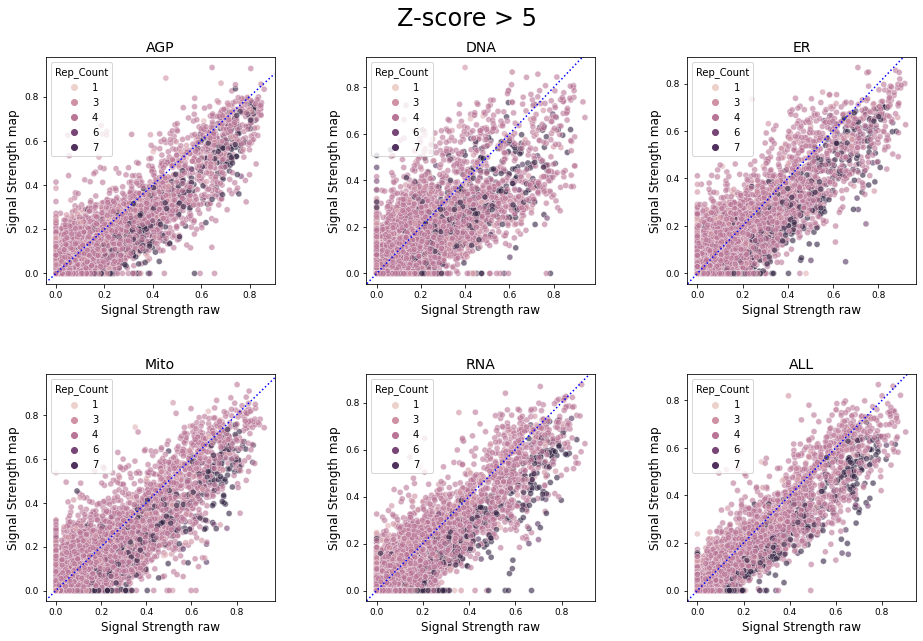

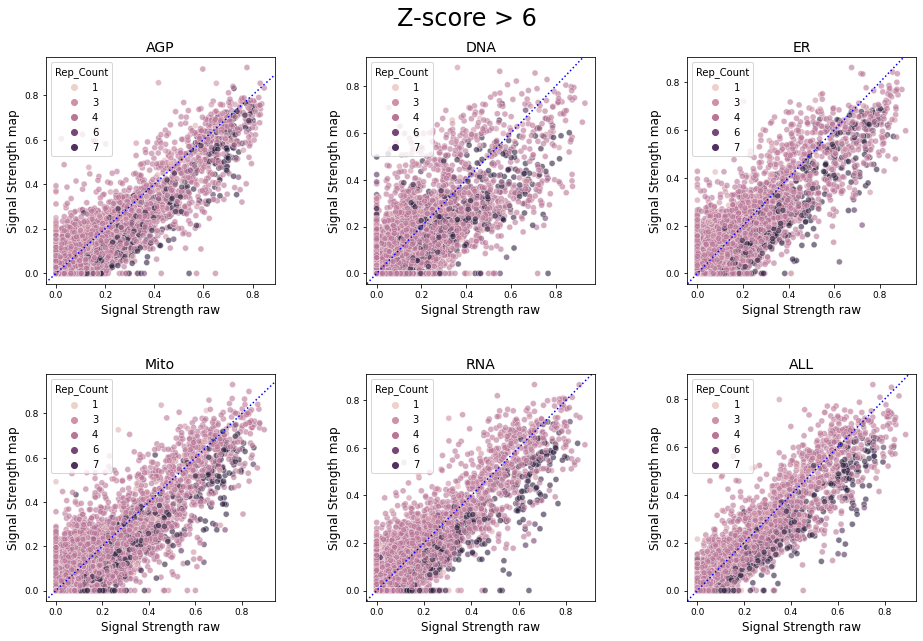

...

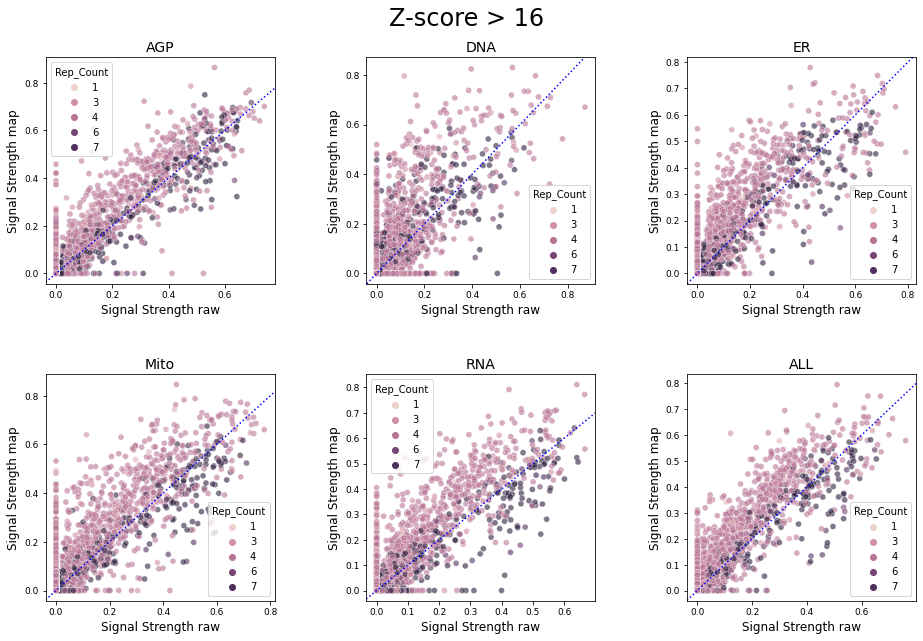

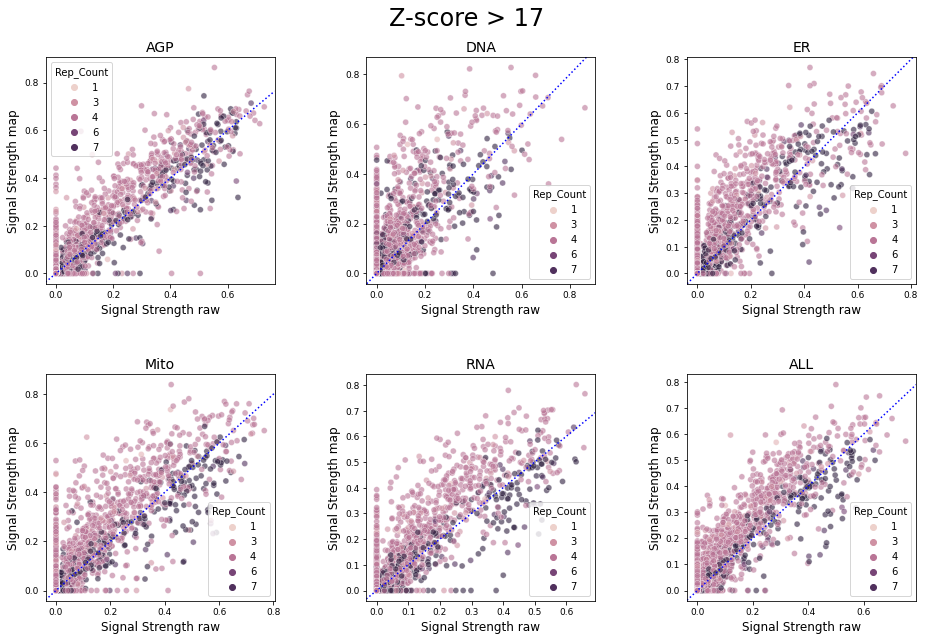

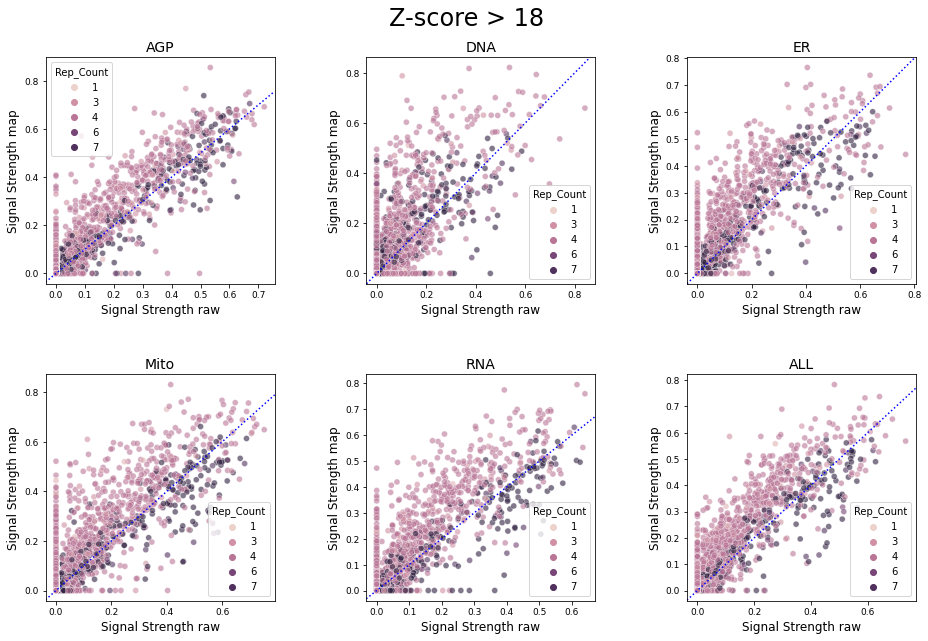

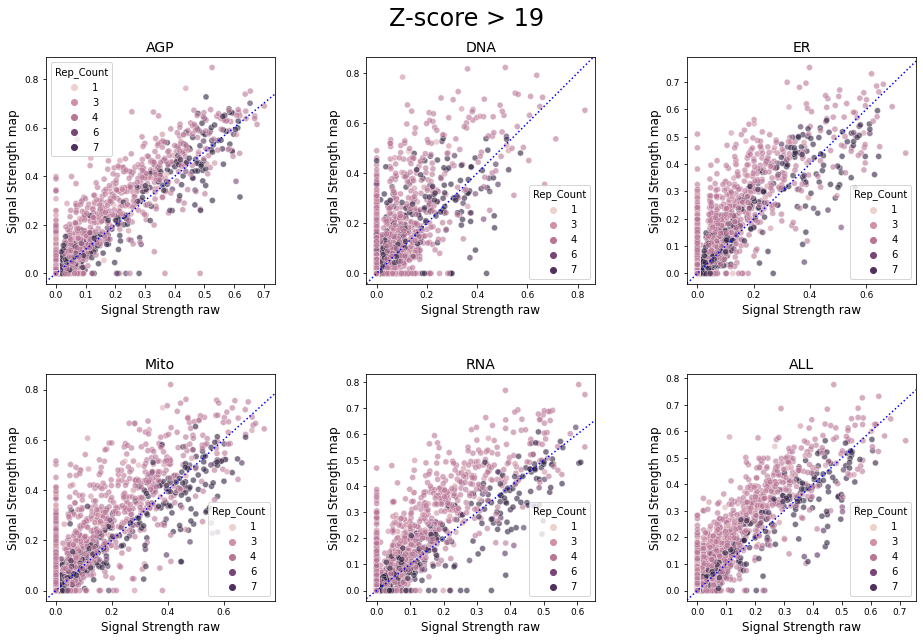

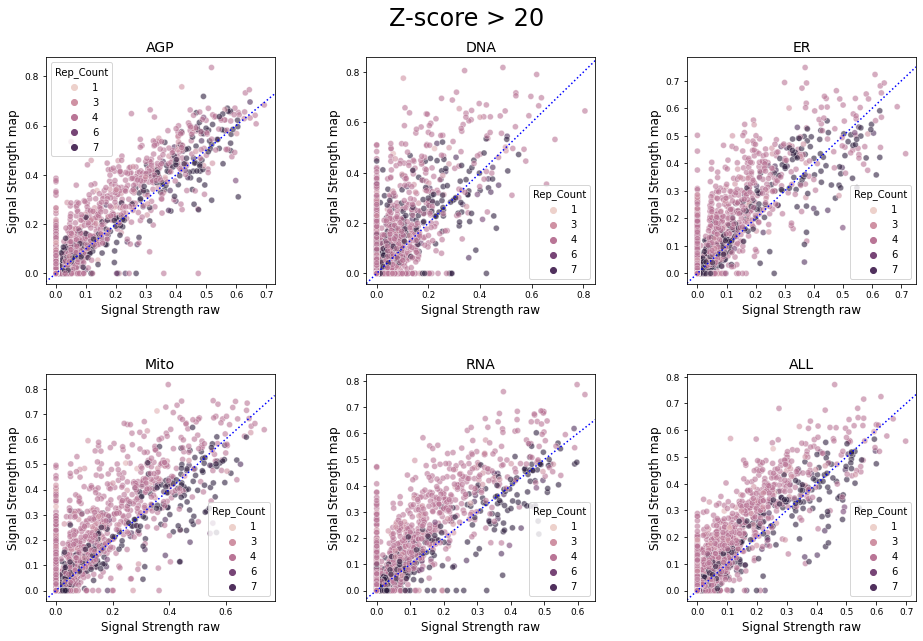

In [112]:
nrow = 2
ncol = 3
d={'xlabel':"Signal Strength raw", 'ylabel':"Signal Strength map"}
colms = cols.keys()

for t in range(2, 21):

    fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    fig.suptitle(f'Z-score > {t}', fontsize = 24, y = 0.95)


    for i, col in enumerate(colms):
        ax[i//ncol,i%ncol].set_title(f'{col}')
        _ = sns.scatterplot(data=res, x=f'{col}_MAS_{t}_raw', y=f'{col}_MAS_{t}_map', hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])

    for i in range(nrow*ncol):
    #     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
    #     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
    #     ax[i//ncol,i%ncol].set(xlim=(0, lim), ylim=(0, lim))
    #     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
        add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


        ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                         bottom=True, top=False, left=True, right=False)
        ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
        ax[i//ncol,i%ncol].yaxis.label.set_size(12)
        ax[i//ncol,i%ncol].xaxis.label.set_size(12)
        ax[i//ncol,i%ncol].title.set_size(14)

    # ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

    # _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

    _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/mas-raw-map-{t}.png', format='png')

In [113]:

from PIL import Image
import glob

imgs = [f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/mas-raw-map-{t}.png' for t in range(2,21)]
# Create the frames
frames = []
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
 
# Save into a GIF file that loops forever
frames[0].save(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/mas-raw-map.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

## y-x (SS) as function of Thresholds

In [19]:
map_raw = pd.concat({f'{chan}_SS_{t}': res[f'{chan}_SS_{t}_map']-res[f'{chan}_SS_{t}_raw'] for chan in cols.keys() for t in range(2, 21)}, axis=1)
map_raw1to1 = pd.concat({f'{chan}_SS_{t}': res[f'{chan}_SS_{t}_map']-res[f'{chan}_SS_{t}_raw1to1'] for chan in cols.keys() for t in range(2, 21)}, axis=1)
raw1to1_raw = pd.concat({f'{chan}_SS_{t}': res[f'{chan}_SS_{t}_raw1to1']-res[f'{chan}_SS_{t}_raw'] for chan in cols.keys() for t in range(2, 21)}, axis=1)

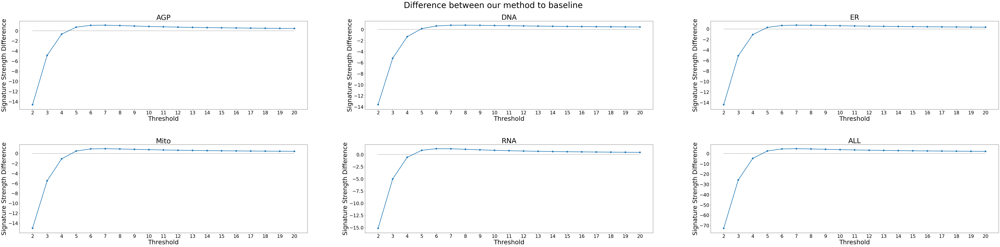

In [20]:
nrow = 2
ncol = 3

d={'xlabel':"Threshold", 'ylabel':"Signature Strength Difference"}

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*30,nrow*10), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Difference between our method to baseline', fontsize = 42, y = 0.95)


for i, chan in enumerate(cols.keys()):
    data = map_raw.filter(like=chan, axis=1).melt(var_name='Threshold', value_name='Signature Strength Difference')
    data['Threshold'] = data['Threshold'].str.strip(f'{chan}_SS_')
    sns.pointplot(data=data, x='Threshold', y='Signature Strength Difference', ax=ax[i//ncol,i%ncol])
    
    ax[i//ncol,i%ncol].set_title(f'{chan}')
    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 24)
    ax[i//ncol,i%ncol].yaxis.label.set_size(32)
    ax[i//ncol,i%ncol].xaxis.label.set_size(32)
    ax[i//ncol,i%ncol].title.set_size(36)
    ax[i//ncol,i%ncol].hlines(0, 0, 18, 'k', ':')
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)

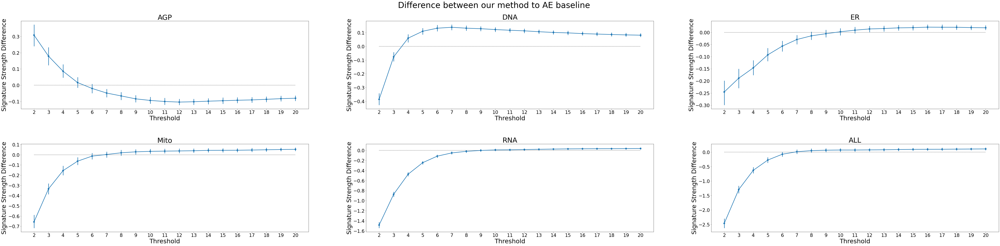

In [21]:
nrow = 2
ncol = 3

d={'xlabel':"Threshold", 'ylabel':"Signature Strength Difference"}

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*30,nrow*10), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Difference between our method to AE baseline', fontsize = 42, y = 0.95)


for i, chan in enumerate(cols.keys()):
    data = map_raw1to1.filter(like=chan, axis=1).melt(var_name='Threshold', value_name='Signature Strength Difference')
    data['Threshold'] = data['Threshold'].str.strip(f'{chan}_SS_')
    sns.pointplot(data=data, x='Threshold', y='Signature Strength Difference', ax=ax[i//ncol,i%ncol])
    
    ax[i//ncol,i%ncol].set_title(f'{chan}')
    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 24)
    ax[i//ncol,i%ncol].yaxis.label.set_size(32)
    ax[i//ncol,i%ncol].xaxis.label.set_size(32)
    ax[i//ncol,i%ncol].title.set_size(36)
    ax[i//ncol,i%ncol].hlines(0, 0, 18, 'k', ':')
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)

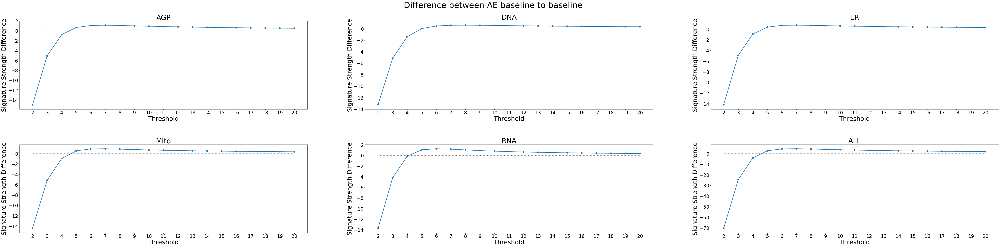

In [22]:
nrow = 2
ncol = 3

d={'xlabel':"Threshold", 'ylabel':"Signature Strength Difference"}

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*30,nrow*10), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Difference between AE baseline to baseline', fontsize = 42, y = 0.95)


for i, chan in enumerate(cols.keys()):
    data = raw1to1_raw.filter(like=chan, axis=1).melt(var_name='Threshold', value_name='Signature Strength Difference')
    data['Threshold'] = data['Threshold'].str.strip(f'{chan}_SS_')
    sns.pointplot(data=data, x='Threshold', y='Signature Strength Difference', ax=ax[i//ncol,i%ncol])
    
    ax[i//ncol,i%ncol].set_title(f'{chan}')
    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 24)
    ax[i//ncol,i%ncol].yaxis.label.set_size(32)
    ax[i//ncol,i%ncol].xaxis.label.set_size(32)
    ax[i//ncol,i%ncol].title.set_size(36)
    ax[i//ncol,i%ncol].hlines(0, 0, 18, 'k', ':')
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)

## Stack Results

In [11]:
def enter_bucket_wrapper(t, th, chan):
    def enter_bucket(sr):
        res = 0
        if sr[f'{chan}_SS_{t}_map'] > th:
            res += 1
        if sr[f'{chan}_SS_{t}_raw'] > th:
            res += 10

        if res == 1:
            return 'map'
        if res == 10:
            return 'raw'
        if res == 11:
            return 'both'

        return 'none'
    
    return enter_bucket

  0%|          | 0/19 [00:00<?, ?it/s]

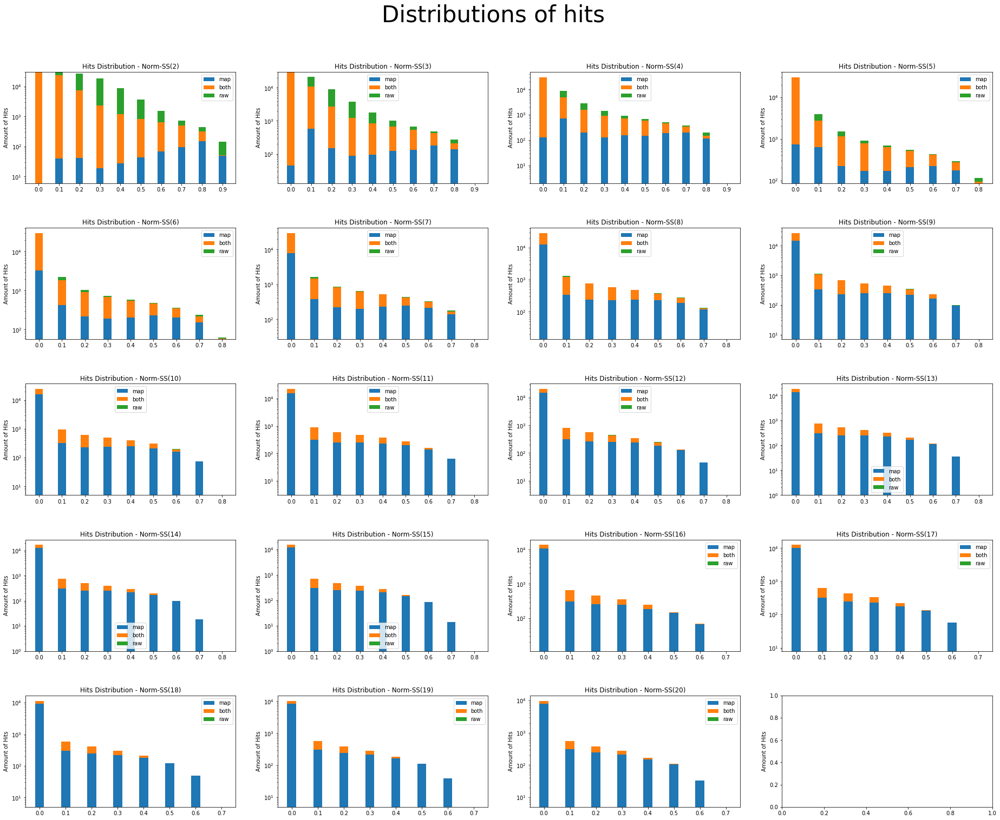

In [24]:
chan = 'ALL'

nrow = 5
ncol = 4

d={'xlabel':"", 'ylabel':"Amount of Hits"}

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*8,nrow*5), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Distributions of hits', fontsize = 42, y = 0.95)

for t in tqdm(range(2, 21)):
    i=t-2
    counts = pd.concat({f'{th:.1f}': res.apply(enter_bucket_wrapper(t, th * len(cols[chan]), chan), axis=1).value_counts() for th in np.arange(0, 1.01, 0.1)}, axis=1)

    labels = counts.columns
    width = 0.35       # the width of the bars: can also be len(x) sequence

    

    ax[i//ncol,i%ncol].bar(labels, counts.loc['map'], width, label='map')
    ax[i//ncol,i%ncol].bar(labels, counts.loc['both'], width, bottom=counts.loc['map'], label='both')
    ax[i//ncol,i%ncol].bar(labels, counts.loc['raw'], width, bottom=counts.loc['map']+counts.loc['both'], label='raw')

    ax[i//ncol,i%ncol].set_yscale('log')
    ax[i//ncol,i%ncol].set_ylabel('Amount of Hits')
    ax[i//ncol,i%ncol].set_title(f'Hits Distribution - Norm-SS({t})')
    ax[i//ncol,i%ncol].legend()

    
plt.show()

  0%|          | 0/19 [00:00<?, ?it/s]

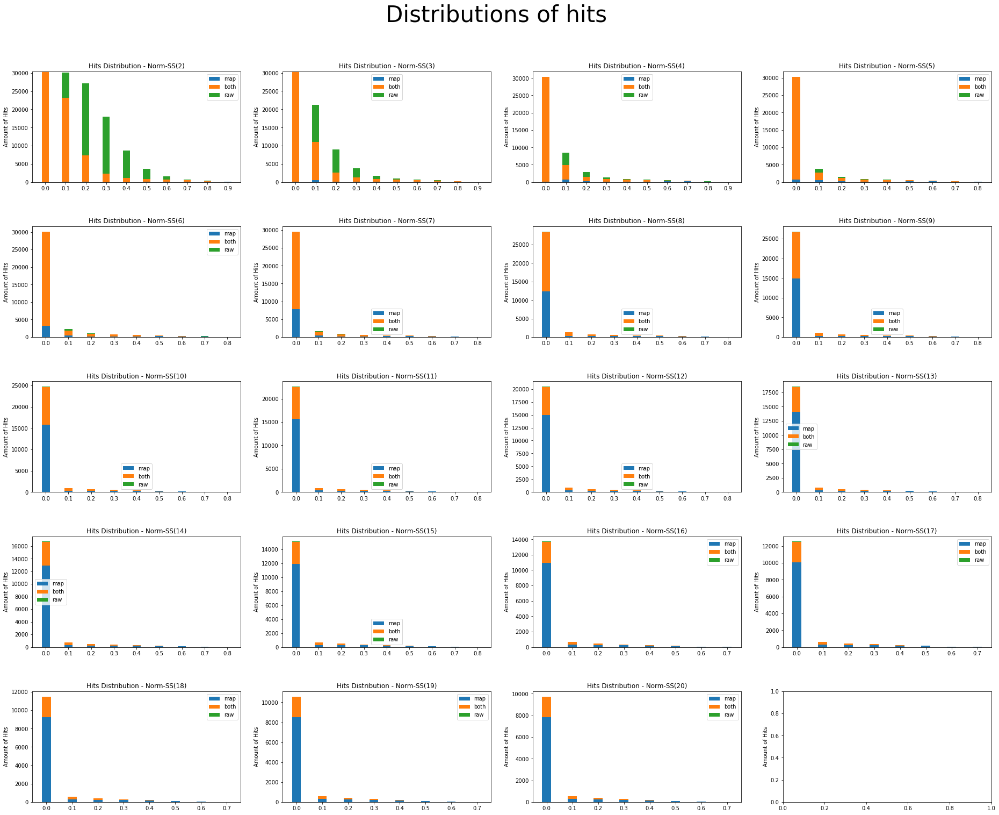

In [25]:
chan = 'ALL'

nrow = 5
ncol = 4

d={'xlabel':"", 'ylabel':"Amount of Hits"}

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*8,nrow*5), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Distributions of hits', fontsize = 42, y = 0.95)

for t in tqdm(range(2, 21)):
    i=t-2
    counts = pd.concat({f'{th:.1f}': res.apply(enter_bucket_wrapper(t, th * len(cols[chan]), chan), axis=1).value_counts() for th in np.arange(0, 1.01, 0.1)}, axis=1)

    labels = counts.columns
    width = 0.35       # the width of the bars: can also be len(x) sequence

    

    ax[i//ncol,i%ncol].bar(labels, counts.loc['map'], width, label='map')
    ax[i//ncol,i%ncol].bar(labels, counts.loc['both'], width, bottom=counts.loc['map'], label='both')
    ax[i//ncol,i%ncol].bar(labels, counts.loc['raw'], width, bottom=counts.loc['map']+counts.loc['both'], label='raw')

#     ax[i//ncol,i%ncol].set_yscale('log')
    ax[i//ncol,i%ncol].set_ylabel('Amount of Hits')
    ax[i//ncol,i%ncol].set_title(f'Hits Distribution - Norm-SS({t})')
    ax[i//ncol,i%ncol].legend()

    
plt.show()

  0%|          | 0/19 [00:00<?, ?it/s]

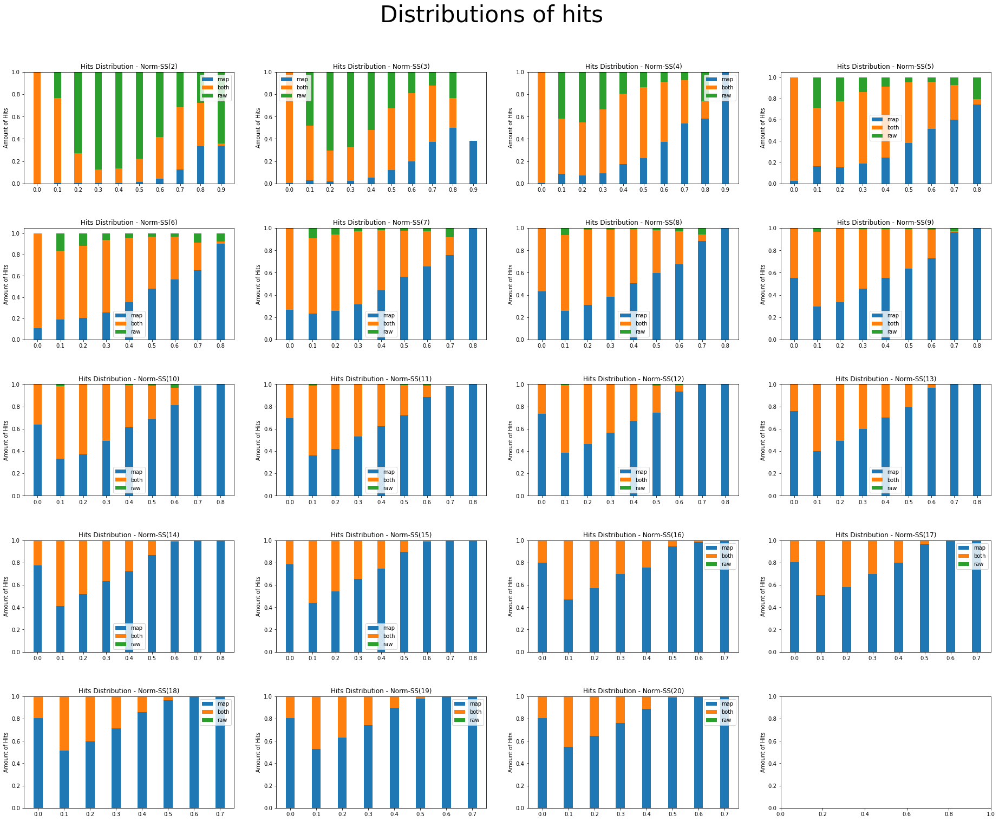

In [26]:
chan = 'ALL'

nrow = 5
ncol = 4

d={'xlabel':"", 'ylabel':"Amount of Hits"}

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*8,nrow*5), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Distributions of hits', fontsize = 42, y = 0.95)

for t in tqdm(range(2, 21)):
    i=t-2
    counts = pd.concat({f'{th:.1f}': res.apply(enter_bucket_wrapper(t, th * len(cols[chan]), chan), axis=1).value_counts() for th in np.arange(0, 1.01, 0.1)}, axis=1)
    counts.loc['hits'] = counts.loc[['map','raw','both']].sum()
    counts.loc['all'] = counts.loc[['map','raw','both', 'none']].sum()

    for m in ['map','raw','both']:
        counts.loc[f'{m}_norm'] = counts.loc[m] / counts.loc['hits']

    labels = counts.columns
    width = 0.35       # the width of the bars: can also be len(x) sequence

    ax[i//ncol,i%ncol].bar(labels, counts.loc['map_norm'], width, label='map')
    ax[i//ncol,i%ncol].bar(labels, counts.loc['both_norm'], width, bottom=counts.loc['map_norm'], label='both')
    ax[i//ncol,i%ncol].bar(labels, counts.loc['raw_norm'], width, bottom=counts.loc['map_norm']+counts.loc['both_norm'], label='raw')

#     ax[i//ncol,i%ncol].set_yscale('log')
    ax[i//ncol,i%ncol].set_ylabel('Amount of Hits')
    ax[i//ncol,i%ncol].set_title(f'Hits Distribution - Norm-SS({t})')
    ax[i//ncol,i%ncol].legend()

    
plt.show()

In [ ]:
counts

,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0
none,20695,29882.0,30064.0,30159.0,30268.0,30331.0,30405.0,30433.0,30438.0,30438.0,30438.0
map,7860,305.0,242.0,212.0,151.0,106.0,33.0,5.0,NaN,NaN,NaN
both,1873,251.0,132.0,67.0,19.0,1.0,NaN,NaN,NaN,NaN,NaN
raw,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Tryout

In [14]:
chan = 'ALL'
t=8
counts = pd.concat({f'{th:.1f}': res.apply(enter_bucket_wrapper(t, th * len(cols[chan]), chan), axis=1).value_counts() for th in np.arange(0, 1.01, 0.1)}, axis=1)

In [15]:
counts

,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0
both,16050,898,517,351,234,144,83,8,NaN,NaN,NaN
map,12308,338,237,225,242,225,187,119,14.0,NaN,NaN
none,1960,29120,29672,29854,29957,30062,30160,30303,30424.0,30438.0,30438.0
raw,120,82,12,8,5,7,8,8,NaN,NaN,NaN


In [ ]:
counts.loc['hits'] = counts.loc[['map','raw','both']].sum()
counts.loc['all'] = counts.loc[['map','raw','both', 'none']].sum()

for m in ['map','raw','both']:
    counts.loc[f'{m}_norm'] = counts.loc[m] / counts.loc['hits']
    
counts

,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0
both,16050.000000,901.000000,517.000000,352.000000,235.000000,146.000000,85.000000,13.000000,NaN,NaN,NaN
map,12312.000000,365.000000,240.000000,225.000000,242.000000,226.000000,191.000000,127.000000,17.0,NaN,NaN
none,1956.000000,29093.000000,29669.000000,29854.000000,29957.000000,30061.000000,30156.000000,30295.000000,30421.0,30438.0,30438.0
raw,120.000000,79.000000,12.000000,7.000000,4.000000,5.000000,6.000000,3.000000,NaN,NaN,NaN
hits,28482.000000,1345.000000,769.000000,584.000000,481.000000,377.000000,282.000000,143.000000,17.0,0.0,0.0
all,30438.000000,30438.000000,30438.000000,30438.000000,30438.000000,30438.000000,30438.000000,30438.000000,30438.0,30438.0,30438.0
both_norm,0.563514,0.669888,0.672302,0.602740,0.488565,0.387268,0.301418,0.090909,NaN,NaN,NaN
map_norm,0.432273,0.271375,0.312094,0.385274,0.503119,0.599469,0.677305,0.888112,1.0,NaN,NaN
raw_norm,0.004213,0.058736,0.015605,0.011986,0.008316,0.013263,0.021277,0.020979,NaN,NaN,NaN


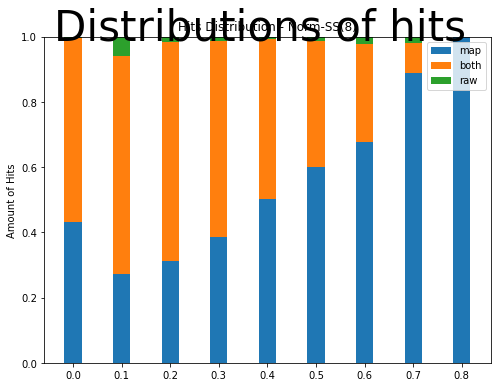

In [ ]:


d={'xlabel':"", 'ylabel':"Amount of Hits"}

fig, ax = plt.subplots(figsize=(8,6), subplot_kw=d, facecolor='white')
fig.subplots_adjust(hspace=0.4, wspace=0.2)
fig.suptitle(f'Distributions of hits', fontsize = 42, y = 0.95)



labels = counts.columns
width = 0.35       # the width of the bars: can also be len(x) sequence



ax.bar(labels, counts.loc['map_norm'], width, label='map')
ax.bar(labels, counts.loc['both_norm'], width, bottom=counts.loc['map_norm'], label='both')
ax.bar(labels, counts.loc['raw_norm'], width, bottom=counts.loc['map_norm']+counts.loc['both_norm'], label='raw')

# ax.set_yscale('log')
ax.set_ylabel('Amount of Hits')
ax.set_title(f'Hits Distribution - Norm-SS({t})')
ax.legend()

    
plt.show()

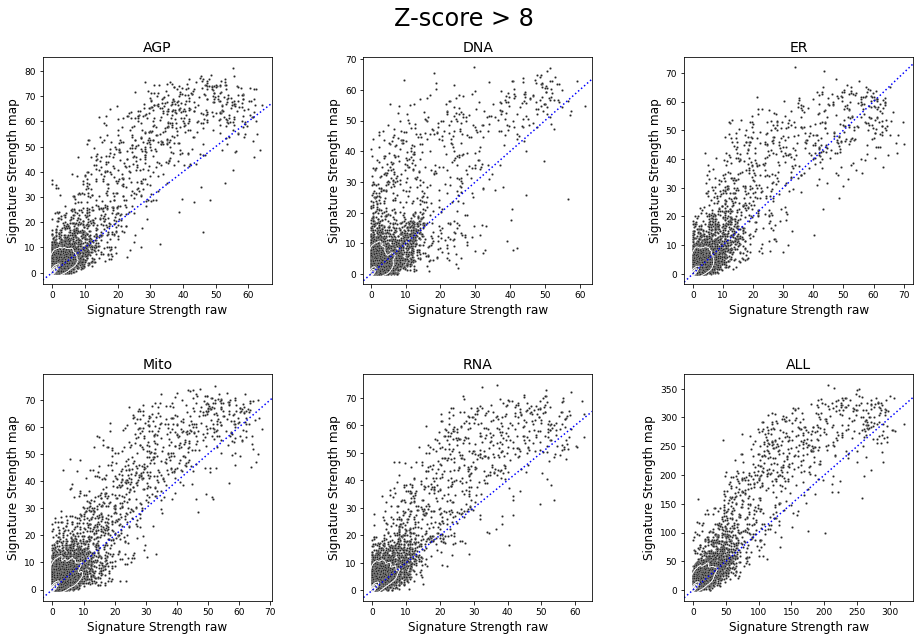

In [10]:
nrow = 2
ncol = 3
d={'xlabel':"Signature Strength raw", 'ylabel':"Signature Strength map"}
colms = cols.keys()

t=8

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
fig.subplots_adjust(hspace=0.4, wspace=0.4)
fig.suptitle(f'Z-score > {t}', fontsize = 24, y = 0.95)


for i, col in enumerate(colms):
    ax[i//ncol,i%ncol].set_title(f'{col}')
    x=f'{col}_SS_{t}_raw'
    y=f'{col}_SS_{t}_map'
#     _ = sns.scatterplot(data=res, x=f'{col}_SS_{t}_raw', y=f'{col}_SS_{t}_map', hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])
    
    sns.scatterplot(x=x, y=y, s=5, color=".15", data=res, ax=ax[i//ncol,i%ncol])
#     sns.histplot(x=x, y=y, bins=50, pthresh=.1, cmap="mako", data=res, ax=ax[i//ncol,i%ncol])
    sns.kdeplot(x=x, y=y, levels=5, color="w", linewidths=1, data=res, ax=ax[i//ncol,i%ncol])

for i in range(nrow*ncol):
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set(xlim=(0, lim), ylim=(0, lim))
#     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
    add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
    ax[i//ncol,i%ncol].yaxis.label.set_size(12)
    ax[i//ncol,i%ncol].xaxis.label.set_size(12)
    ax[i//ncol,i%ncol].title.set_size(14)

# ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

# _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

# _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png', format='png')

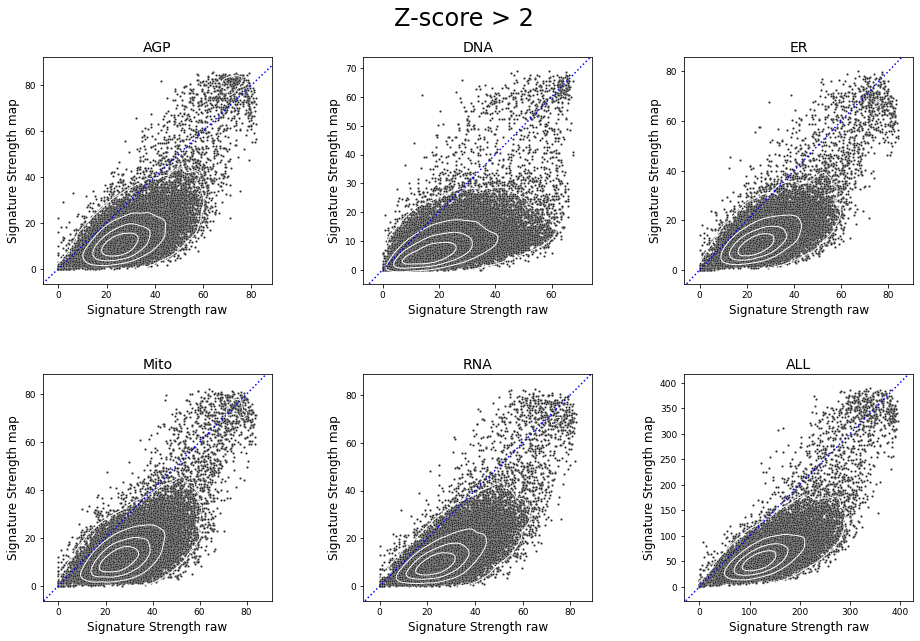

In [11]:
nrow = 2
ncol = 3
d={'xlabel':"Signature Strength raw", 'ylabel':"Signature Strength map"}
colms = cols.keys()

t=2

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
fig.subplots_adjust(hspace=0.4, wspace=0.4)
fig.suptitle(f'Z-score > {t}', fontsize = 24, y = 0.95)


for i, col in enumerate(colms):
    ax[i//ncol,i%ncol].set_title(f'{col}')
    x=f'{col}_SS_{t}_raw'
    y=f'{col}_SS_{t}_map'
#     _ = sns.scatterplot(data=res, x=f'{col}_SS_{t}_raw', y=f'{col}_SS_{t}_map', hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])
    
    sns.scatterplot(x=x, y=y, s=5, color=".15", data=res, ax=ax[i//ncol,i%ncol])
#     sns.histplot(x=x, y=y, bins=50, pthresh=.1, cmap="mako", data=res, ax=ax[i//ncol,i%ncol])
    sns.kdeplot(x=x, y=y, levels=5, color="w", linewidths=1, data=res, ax=ax[i//ncol,i%ncol])

for i in range(nrow*ncol):
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set(xlim=(0, lim), ylim=(0, lim))
#     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
    add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
    ax[i//ncol,i%ncol].yaxis.label.set_size(12)
    ax[i//ncol,i%ncol].xaxis.label.set_size(12)
    ax[i//ncol,i%ncol].title.set_size(14)

# ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

# _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

# _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png', format='png')

In [9]:
res

,Rep_Count,AGP_Med_Corr_map,AGP_SS_2_map,AGP_MAS_2_map,AGP_SS_3_map,AGP_MAS_3_map,AGP_SS_4_map,AGP_MAS_4_map,AGP_SS_5_map,AGP_MAS_5_map,...,ALL_SS_16_raw1to1,ALL_MAS_16_raw1to1,ALL_SS_17_raw1to1,ALL_MAS_17_raw1to1,ALL_SS_18_raw1to1,ALL_MAS_18_raw1to1,ALL_SS_19_raw1to1,ALL_MAS_19_raw1to1,ALL_SS_20_raw1to1,ALL_MAS_20_raw1to1
Metadata_broad_sample,,,,,,,,,,,,,,,,,,,,,
BRD-A00037023-001-05-1,4,0.329475,14.000000,0.231593,6.750000,0.160810,2.000000,0.087534,1.250000,0.069202,...,0.000,0.000000,0.00,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000
BRD-A00051892-001-05-0,4,0.320207,11.250000,0.204665,5.250000,0.139813,1.750000,0.080721,0.750000,0.052844,...,0.000,0.000000,0.00,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000
BRD-A00100033-001-04-8,8,-0.016669,20.375000,0.000000,15.000000,0.000000,11.750000,0.000000,9.250000,0.000000,...,1.875,0.015775,1.25,0.012880,0.875,0.010776,0.375,0.007055,0.375,0.007055
BRD-A00214921-001-04-2,4,-0.334814,14.500000,0.000000,7.250000,0.000000,2.750000,0.000000,2.000000,0.000000,...,0.000,0.000000,0.00,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000
BRD-A00250346-001-05-0,4,-0.016536,17.250000,0.000000,8.500000,0.000000,3.750000,0.000000,2.000000,0.000000,...,0.000,0.000000,0.00,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BRD-M97109212-001-01-8,4,0.114875,19.500000,0.161391,11.500000,0.123940,7.000000,0.096697,4.500000,0.077530,...,0.750,0.017932,0.75,0.017932,0.750,0.017932,0.750,0.017932,0.500,0.014641
BRD-M97925630-001-01-1,4,0.264035,8.500000,0.161544,3.750000,0.107299,2.500000,0.087609,1.500000,0.067862,...,0.000,0.000000,0.00,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000
BRD-M98484762-001-01-8,4,0.117381,11.000000,0.122531,7.500000,0.101177,3.000000,0.063990,1.750000,0.048873,...,0.000,0.000000,0.00,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000


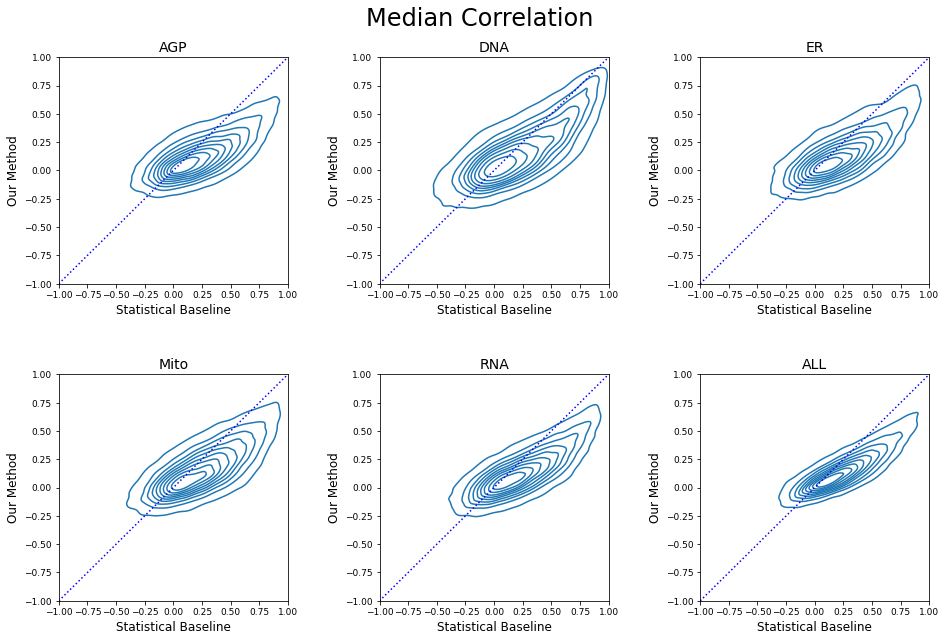

In [14]:
nrow = 2
ncol = 3
d={'xlabel':"Statistical Baseline", 'ylabel':"Our Method"}
colms = cols.keys()

t=2

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
fig.subplots_adjust(hspace=0.4, wspace=0.4)
fig.suptitle(f'Median Correlation', fontsize = 24, y = 0.95)


for i, col in enumerate(colms):
    ax[i//ncol,i%ncol].set_title(f'{col}')
    x=f'{col}_Med_Corr_raw'
    y=f'{col}_Med_Corr_map'
#     _ = sns.scatterplot(data=res, x=x, y=y, hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])
    _ = sns.kdeplot(data=res, x=x, y=y, ax=ax[i//ncol,i%ncol])
    
#     sns.scatterplot(x=x, y=y, s=5, color=".15", data=res, ax=ax[i//ncol,i%ncol])
# #     sns.histplot(x=x, y=y, bins=50, pthresh=.1, cmap="mako", data=res, ax=ax[i//ncol,i%ncol])
#     sns.kdeplot(x=x, y=y, levels=5, color="w", linewidths=1, data=res, ax=ax[i//ncol,i%ncol])

for i in range(nrow*ncol):
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
    ax[i//ncol,i%ncol].set(xlim=(-1, 1), ylim=(-1, 1))
#     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
    add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
    ax[i//ncol,i%ncol].yaxis.label.set_size(12)
    ax[i//ncol,i%ncol].xaxis.label.set_size(12)
    ax[i//ncol,i%ncol].title.set_size(14)

# ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

# _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

# _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png', format='png')

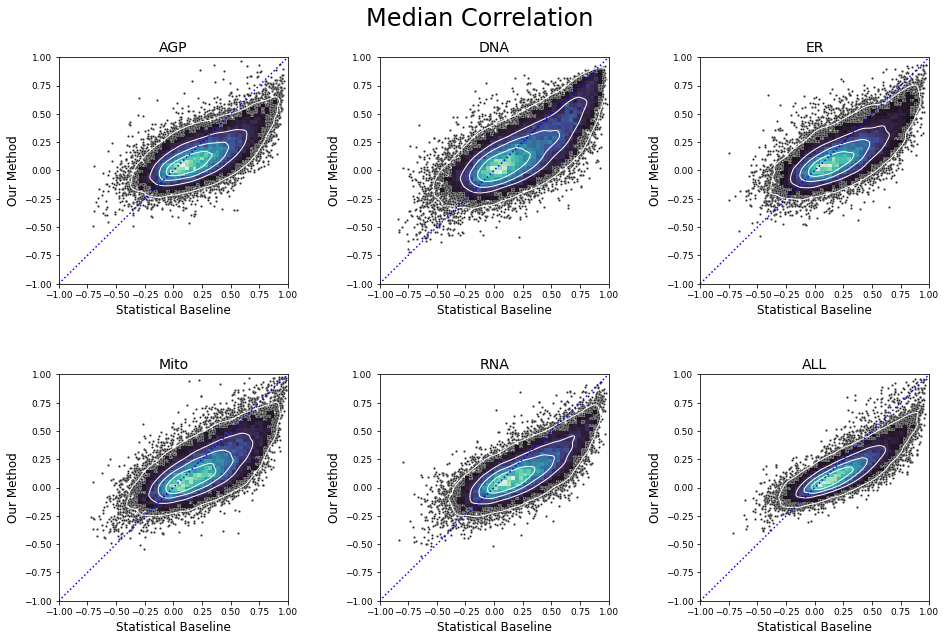

In [15]:
nrow = 2
ncol = 3
d={'xlabel':"Statistical Baseline", 'ylabel':"Our Method"}
colms = cols.keys()

t=2

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
fig.subplots_adjust(hspace=0.4, wspace=0.4)
fig.suptitle(f'Median Correlation', fontsize = 24, y = 0.95)


for i, col in enumerate(colms):
    ax[i//ncol,i%ncol].set_title(f'{col}')
    x=f'{col}_Med_Corr_raw'
    y=f'{col}_Med_Corr_map'
#     _ = sns.scatterplot(data=res, x=x, y=y, hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])
#     _ = sns.kdeplot(data=res, x=x, y=y, ax=ax[i//ncol,i%ncol])
    
    sns.scatterplot(x=x, y=y, s=5, color=".15", data=res, ax=ax[i//ncol,i%ncol])
    sns.histplot(x=x, y=y, bins=50, pthresh=.1, cmap="mako", data=res, ax=ax[i//ncol,i%ncol])
    sns.kdeplot(x=x, y=y, levels=5, color="w", linewidths=1, data=res, ax=ax[i//ncol,i%ncol])

for i in range(nrow*ncol):
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
    ax[i//ncol,i%ncol].set(xlim=(-1, 1), ylim=(-1, 1))
#     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
    add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
    ax[i//ncol,i%ncol].yaxis.label.set_size(12)
    ax[i//ncol,i%ncol].xaxis.label.set_size(12)
    ax[i//ncol,i%ncol].title.set_size(14)

# ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

# _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

# _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png', format='png')

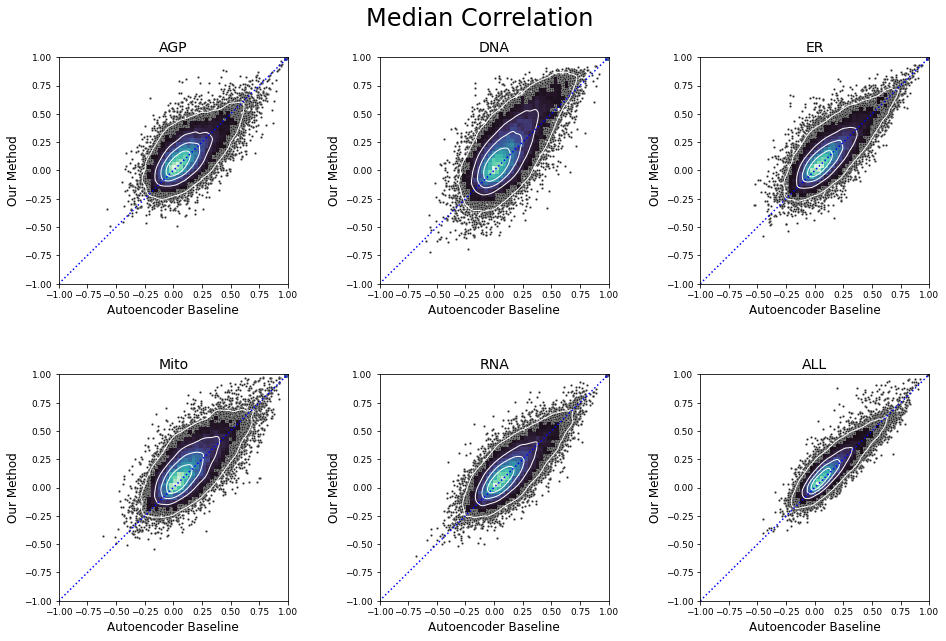

In [16]:
nrow = 2
ncol = 3
d={'xlabel':"Autoencoder Baseline", 'ylabel':"Our Method"}
colms = cols.keys()

t=2

fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=(ncol*5.2,nrow*5), subplot_kw=d, facecolor='#FFFFFF')
fig.subplots_adjust(hspace=0.4, wspace=0.4)
fig.suptitle(f'Median Correlation', fontsize = 24, y = 0.95)


for i, col in enumerate(colms):
    ax[i//ncol,i%ncol].set_title(f'{col}')
    x=f'{col}_Med_Corr_raw1to1'
    y=f'{col}_Med_Corr_map'
#     _ = sns.scatterplot(data=res, x=x, y=y, hue='Rep_Count', alpha=0.6, ax=ax[i//ncol,i%ncol])
#     _ = sns.kdeplot(data=res, x=x, y=y, ax=ax[i//ncol,i%ncol])
    
    sns.scatterplot(x=x, y=y, s=5, color=".15", data=res, ax=ax[i//ncol,i%ncol])
    sns.histplot(x=x, y=y, bins=50, pthresh=.1, cmap="mako", data=res, ax=ax[i//ncol,i%ncol])
    sns.kdeplot(x=x, y=y, levels=5, color="w", linewidths=1, data=res, ax=ax[i//ncol,i%ncol])

for i in range(nrow*ncol):
#     ax[i//ncol,i%ncol].set_yscale('symlog', base=10)
#     ax[i//ncol,i%ncol].set_xscale('symlog', base=10)
    ax[i//ncol,i%ncol].set(xlim=(-1, 1), ylim=(-1, 1))
#     ax[i//ncol,i%ncol].plot(range(-lim*2, lim*2), range(-lim*2, lim*2), 'b:')
    add_identity(ax[i//ncol,i%ncol], color='b', ls=':')


    ax[i//ncol,i%ncol].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=False, left=True, right=False)
    ax[i//ncol,i%ncol].tick_params(axis='both', labelsize = 9)
    ax[i//ncol,i%ncol].yaxis.label.set_size(12)
    ax[i//ncol,i%ncol].xaxis.label.set_size(12)
    ax[i//ncol,i%ncol].title.set_size(14)

# ax[0,0].set(xlim=(-1, lim*5), ylim=(-1, lim*5))

# _ = fig.legend(symbols, zscores.keys(), markerscale=1.2, loc='center right')#, fontsize='xx-large')

# _ = fig.savefig(f'/sise/assafzar-group/g-and-n/tabular_models_results/30000/results/z_scores/ss_mas/plots/ss-raw-map-no-abs-{t}.png', format='png')